## Scrape information of restaurants in major cities of US from Yelp using Python and BeautifulSoup 

### Import required libraries:
- requests - to downloading the required webpage from yelp.com
- BeautifulSoup - To extract data from the HTML webpage

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import re

### Forming the request URL

Let us extract the information of top 100 highly rated restaurants from each of the below major cities of United States:
- Seattle 
- New York 
- Los Angeles
- Chicago
- Columbus
- Las Vegas
- Oklahoma City
- Portland
- Nashville-Davidson
- Denver
- Fort Worth
- El Paso
- Charlotte
- Boston
- Milwaukee
- Baltimore
- Atlanta
- Austin
- Jacksonville
- San Francisco
- Indianapolis
- San Jose
- Detroit
- San Antonio
- Dallas
- San Diego
- Phoenix
- Philadelphia
- Houston
- Cincinnati

To extract the restaurants in a particular location:
- Using URL - https://www.yelp.com/search?cflt=restaurants&find_loc={location}

This returns multiple pages containing resturants information. Each page in contains 10 restaurants.

Since, for each location we need the top 100 highly rated restaurants, We sort them by rating:
- Using URL - https://www.yelp.com/search?cflt=restaurants&find_loc={location}&sortby=rating

To extract the restaurants in a particular page and a location:
- Using URL - https://www.yelp.com/search?cflt=restaurants&find_loc={location}&sortby=rating&start={page}

Here the page varies from 0 to 9 (10 pages) - 100 restaurants

In [2]:
headers = {
'user-agent': 'Mozilla/5.0',
}

#returns the page content on giving location and page as parameters to form the request url.
def get_page(location, page):
    location=location.replace(' ', '+')
    url=f"https://www.yelp.com/search?cflt=restaurants&find_loc={location}&sortby=rating&start={page}"
    webpage = requests.get(url, headers=headers).text
    return webpage

### Extract restaurant information from the Yelp restaurant page

We want to extract the following information for each restaurant from the result page:
- Restaurant name
- Rating
- Number of reviews
- Tags
- Price
- Neighborhood (Region)

The snapshot below presents the result page with annotations, indicating the location of all of this information:

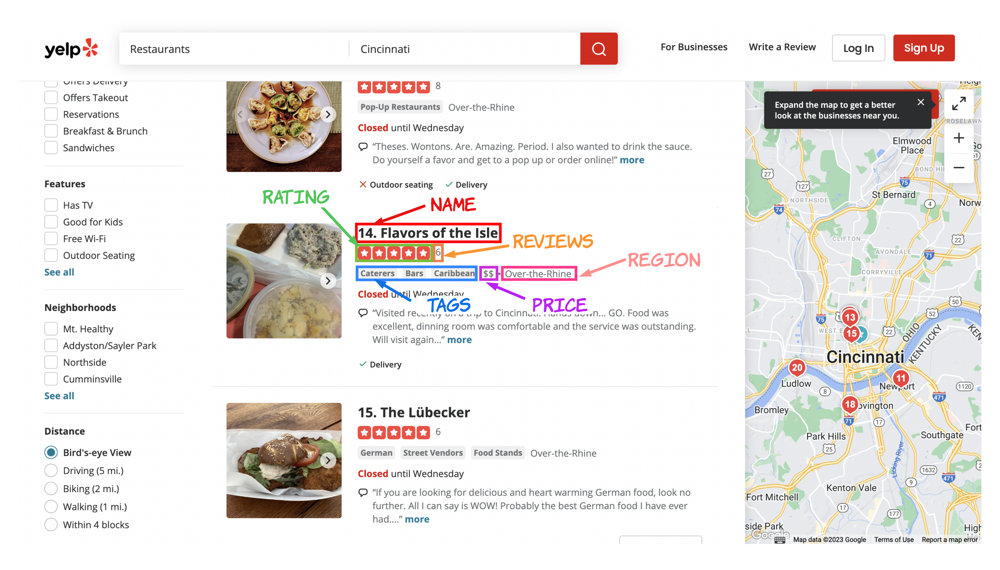

Now, We can inspect the returned HTML web page to locate this information and use BeautifulSoup to extract the corresponding information using the code below.

The HTML for a single restaurant will look like this:
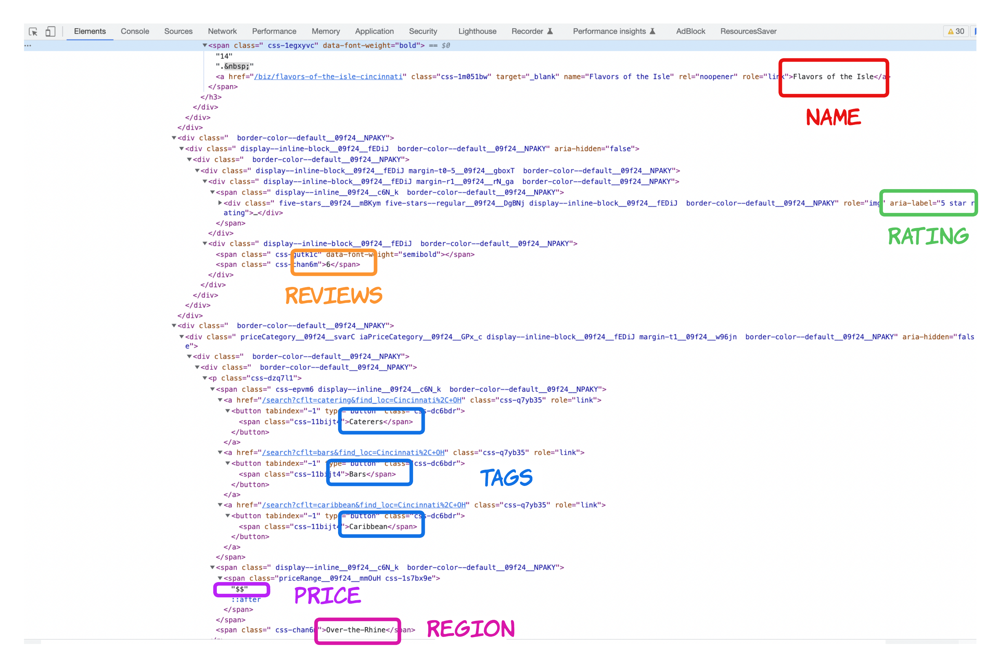

In [3]:
list_of_cities_usa=['Seattle', 'New York', 'Los Angeles,', 'Chicago', 'Columbus', 'Las Vegas', 'Oklahoma City', 'Portland', 'Nashville-Davidson', 'Denver',
                   'Fort Worth', 'El Paso', 'Charlotte', 'Boston', 'Milwaukee', 'Baltimore', 'Atlanta', 'Austin', 'Jacksonville', 'San Francisco', 
                   'Indianapolis', 'San Jose', 'Detroit', 'San Antonio', 'Dallas', 'San Diego', 'Phoenix', 'Philadelphia', 'Houston', 'Cincinnati']

restaurant_names=[]
location=[]
rating=[]
reviews=[]
res_all_tags=[]

restaurant_name=None
rating=None
reviews=None
tags=None
price=None
region=None

restaurant_df = pd.DataFrame()

for city in list_of_cities_usa:
#     print(city)
    for page_num in range(0,10):
        web_page=get_page(city, page_num*10)
        soup=BeautifulSoup(web_page, 'html.parser')
        res_list=soup.find_all('li')
        res_final_list=[]
        for res in res_list:
            res_title=res.find('h3')
            if res_title!=None:
                x = re.search("^\d+[.].+", res_title.text)
                if x:
                    res_final_list.append(res)
#                     print(res_title.text)
        res_list=res_final_list[1:]
        
        for res in res_list:
            try:
                res_title=res.find('h3')
                restaurant_name=res_title.text
                restaurant_name=restaurant_name.split(' ')[1:]
                restaurant_name=' '.join(restaurant_name)
                res_info=res_title.parent.parent.parent.next_sibling

                res_info_2=res_info.find_all('span')

                rating=res_info_2[0].find('div')['aria-label']
                rating=rating.split(' ')[0]
                
                reviews=res_info_2[2].text
                res_tags=res_info.next_sibling
                res_tags_2=list(res_tags.find('p').children)

                tags_web=res_tags_2[0].find_all('a')
                tags=[]
                for t in tags_web:
                    tags.append(t.text)
                res_all_tags.append(tags)
                if len(res_tags_2)==3:
                    price=res_tags_2[1].text
                    region=res_tags_2[2].text

                elif len(res_tags_2)==2:
                    pr=res_tags_2[1].text
                    if '$' in pr:
                        price=pr
                    else:
                        region=pr
            except:
                pass
            
#             print(restaurant_name, rating, reviews, tags, price, region)
            row={'Name' : restaurant_name, 'City':city, 'Rating' : rating, 'Reviews' : reviews, 'Tags': tags, 'Price': price, 'Region':region}
            restaurant_df = restaurant_df.append(row, ignore_index = True)
    

### Storing the scraped restaurants information into a CSV file.

In [4]:
print(restaurant_df)
restaurant_df.to_csv("Restaurants.csv", sep='\t')

                     Name        City Rating Reviews  \
0                    Dogs     Seattle      5       5   
1     An’Clair - Fairview     Seattle      5       8   
2                Cafe Bar     Seattle      5       7   
3                  Market     Seattle      5       6   
4                 & Tings     Seattle      5       6   
...                   ...         ...    ...     ...   
2619            & Dolores  Cincinnati    4.5     636   
2620              Shaddai  Cincinnati    4.5       9   
2621            Tea House  Cincinnati    4.5      18   
2622               Corner  Cincinnati    4.5      27   
2623       Nepali Cuisine  Cincinnati    4.5      39   

                                          Tags Price            Region  
0                                   [Hot Dogs]  None      Capitol Hill  
1                                      [Cafes]  None  South Lake Union  
2     [Cafes, Coffee & Tea, Coffee Roasteries]  None  South Lake Union  
3                      [Farmers Mar